In [1]:
import numpy as np
import matplotlib
import sys, platform, os
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import camb
from scipy.interpolate import interp1d

from camb import model, initialpower
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interactive, interact, fixed
from scipy.signal import convolve

from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_notebook  # Use an alias to avoid conflicts


%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from my_functions import * # the module of functions

# Power Spectra

In [2]:
# Read the PS originated from the Common_notebook
Original_PS = np.loadtxt('dati\Original_PS_001.txt')

In [3]:
TT_ps  = Original_PS[0]
TE_ps  = Original_PS[1]
EE_ps  = Original_PS[2]
BB_ps  = Original_PS[3]
BB_ps_tensor  = Original_PS[4]

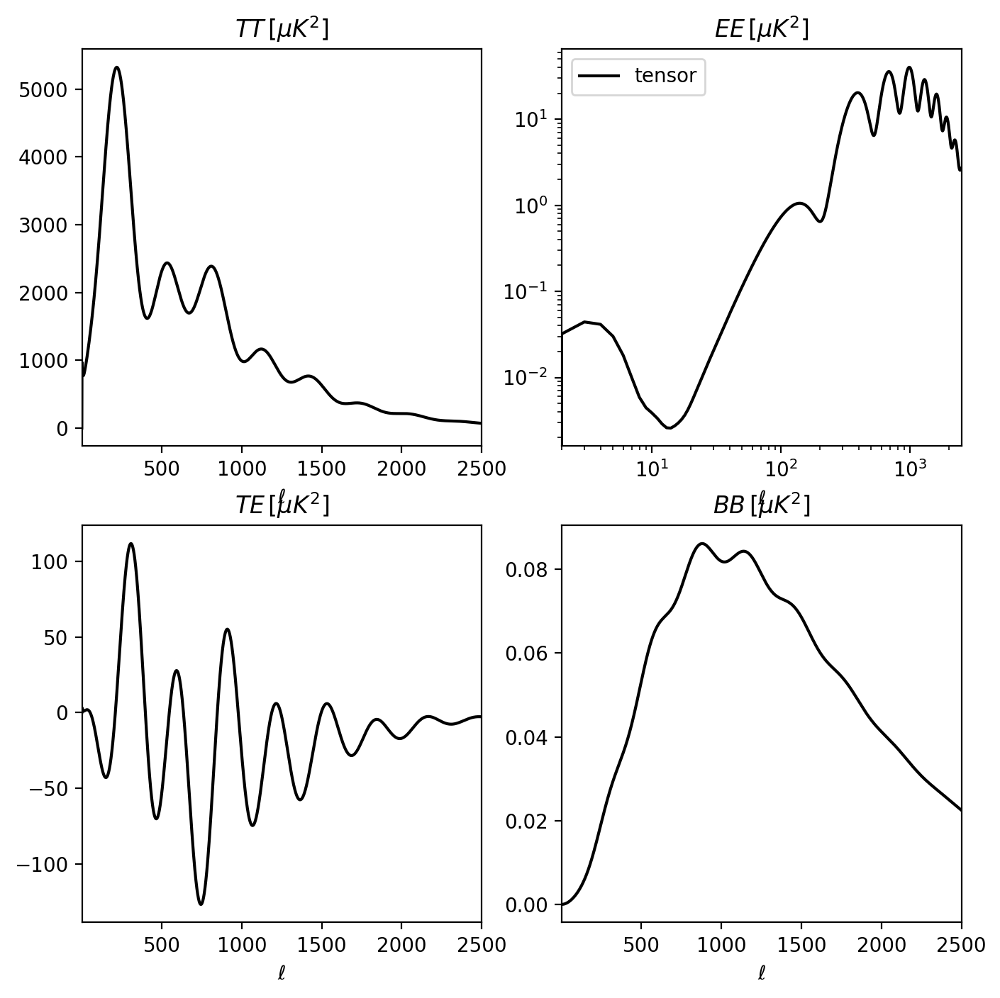

In [4]:
#plot the total CMB power spectra

ls = np.arange(TT_ps.shape[0])
fig, ax = plt.subplots(2,2, figsize = (8,8))

# TT
ax[0,0].plot(ls,TT_ps, color='k')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')

#TE
ax[1,0].plot(ls,TE_ps, color='k')
ax[1,0].set_title(r'$TE\, [\mu K^2]$')

#EE
ax[0,1].loglog(ls,EE_ps, color='k', label="tensor")
ax[0,1].set_title(r'$EE\, [\mu K^2]$')
ax[0,1].legend()

# BB
ax[1,1].plot(ls,BB_ps, color='k')
ax[1,1].set_title(r'$BB\, [\mu K^2]$')

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

# Mappe

In [5]:
# MAP PARAMETERS

pix_size         = 0.5                              #arcmin
N                = 2**10                            #num pixel lineare
X_width, Y_width = N*pix_size/60., N*pix_size/60.   #dimensioni mappa in gradi
Nsqdeg           = X_width**2

c_min, c_max     = -200, 200                        #color map


# If I want to start from a given map dimension instead of number and size of pixels I do:
#N = (X_width * 60)/ pix_size #pixel number

print(f"Map with {N} x {N} pixels, each of {pix_size} arcmin, for a total dimension of {X_width:.2f} x {Y_width:.2f} gradi")


nbig = 5000

Map with 1024 x 1024 pixels, each of 0.5 arcmin, for a total dimension of 8.53 x 8.53 gradi


In [6]:
# ORIGINAL MAPS

ell_big = np.arange(nbig)

TT_ps_big = np.zeros(nbig)
TT_ps_big[ls.astype(int)] = TT_ps

EE_ps_big = np.zeros(nbig)
EE_ps_big[ls.astype(int)] = EE_ps

BB_ps_big = np.zeros(nbig)
BB_ps_big[ls.astype(int)] = BB_ps

TE_ps_big = np.zeros(nbig)
TE_ps_big[ls.astype(int)] = TE_ps

ell    = ell_big
ps_TT  = TT_ps_big + 1e-3   
ps_EE  = EE_ps_big + 1e-3
ps_BB  = BB_ps_big + 1e-3
ps_TE  = TE_ps_big

Temp_point_source_spectrum = ps_TT[1000]*(ell/3000.)**2.
Pol_point_source_spectrum  = ps_EE[1500]*(ell/4500.)**2.

ps_TT = ps_TT + Temp_point_source_spectrum  
ps_EE = ps_EE + Pol_point_source_spectrum
ps_BB = ps_BB + Pol_point_source_spectrum



T_map, Q_map, U_map, E_map, B_map = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE,ps_TE,ps_BB)

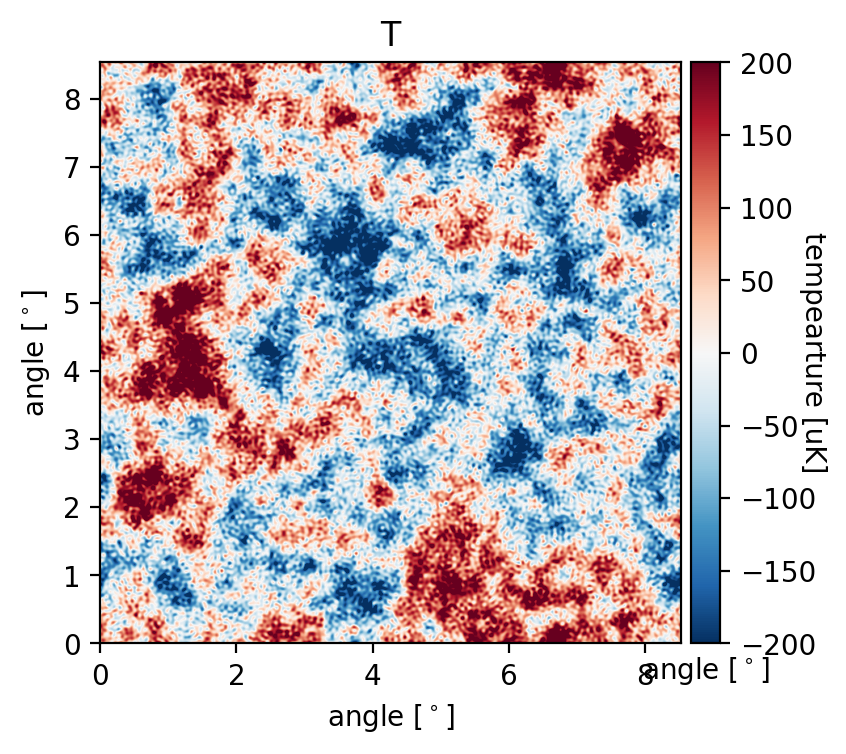

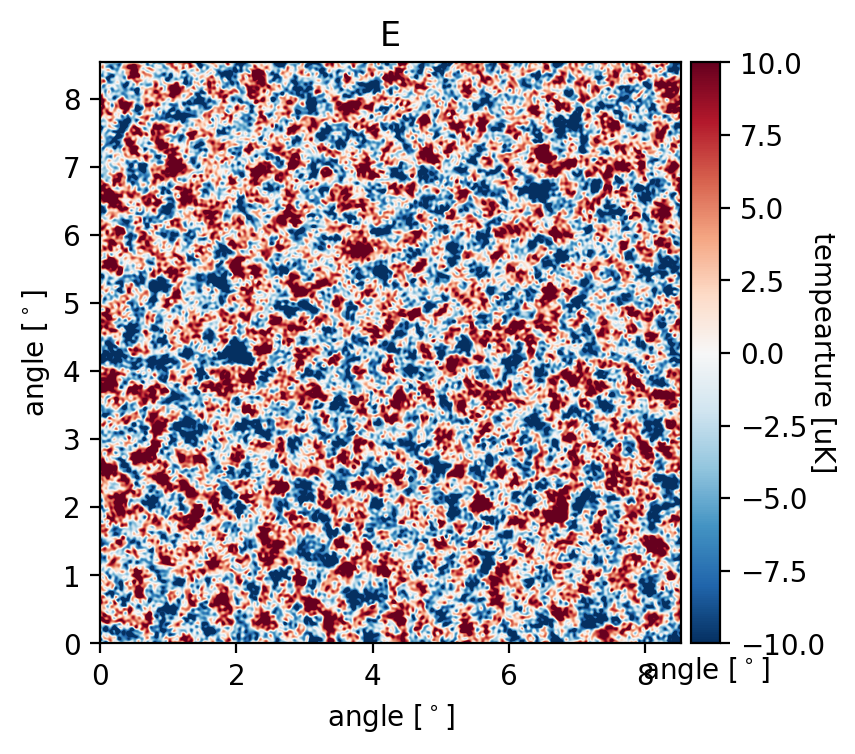

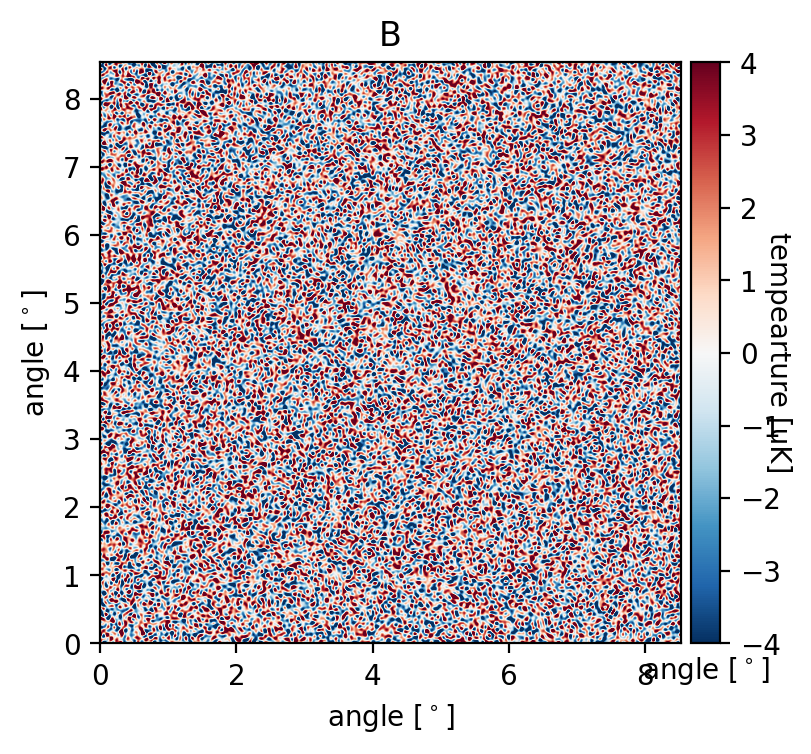

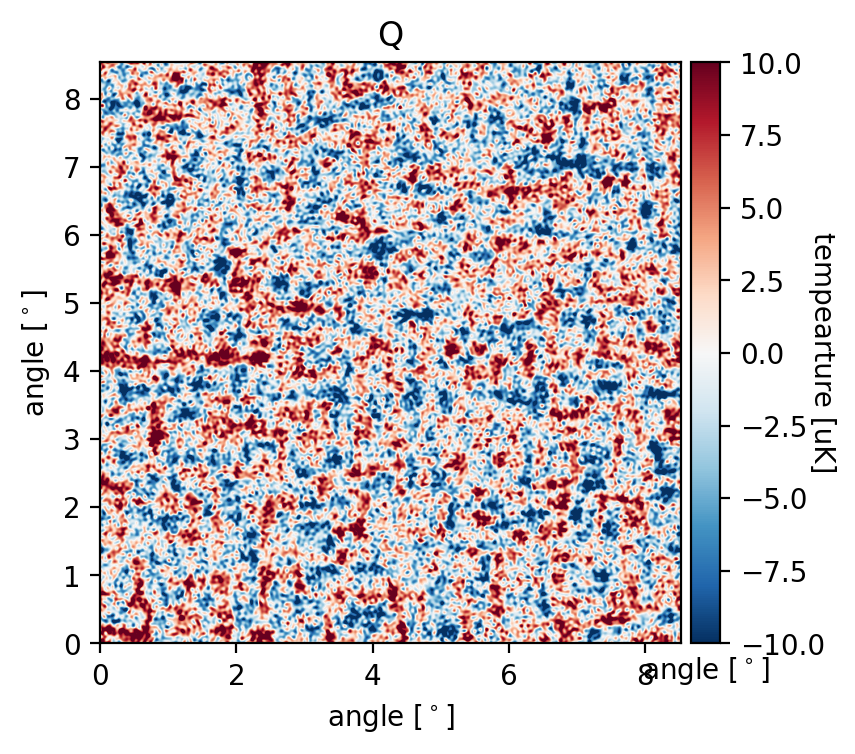

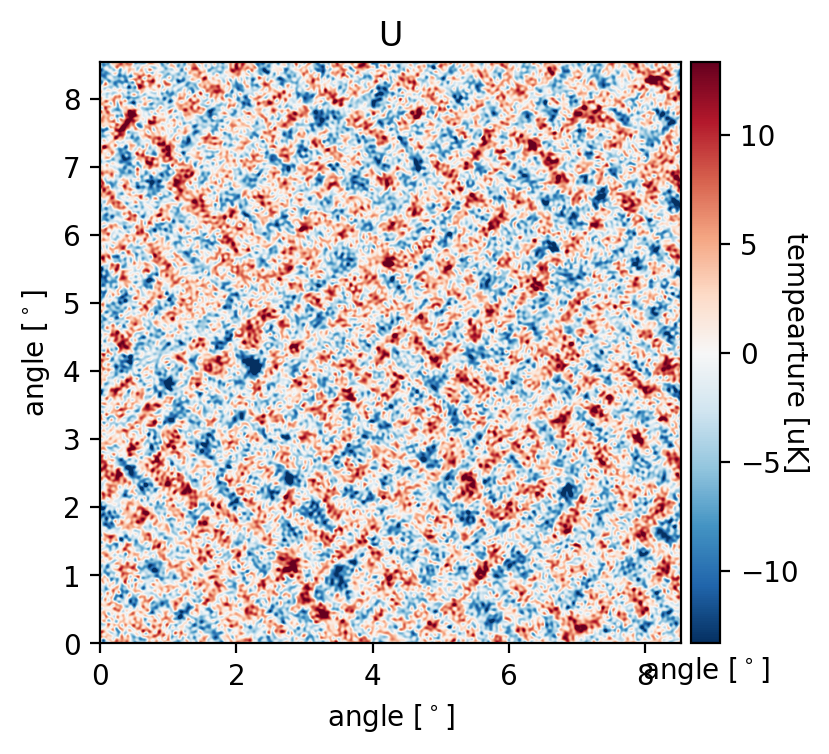

In [7]:
# PLOT ORIGINAL MAPS

plt.title("T")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(T_map,c_min,c_max,X_width,Y_width)

plt.title("E")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_map,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_map,c_min/50.,c_max/50.,X_width,Y_width)

plt.title("Q")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map,c_min/15.,c_max/15.,X_width,Y_width)

## Beam + rings
Simulation of a realistic beam with a gaussian center peak and secondary peaks
https://github.com/McMahonCosmologyGroup/cmbInstrumentSummerSchool/blob/main/Notebook2_beam_systematics.ipynb

In [8]:
# INTERACTIVE PLOT 
#@interact(azimuth=(0, 360, 1), elevation=(0, 90, 1))
def plot_3d_gaussian(x, y, result, azimuth, elevation, title):
    from ipywidgets import interactive, interact, fixed
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x, y, result, cmap='viridis')
    ax.set_title(title)
    #ax.set_xlabel('X (degrees)')
    #ax.set_ylabel('Y (degrees)')
    #ax.set_zlabel('Normalized Intensity')

    ax.view_init(elev=elevation, azim=azimuth)

    plt.show()
    
#plot_3d_gaussian(x_1, y_1, result, azimuth=45, elevation=30)

In [9]:
# FUNCTION TO CREATE THE BEAM

def create_beam_secpeaks(FWHMx, FWHMy, theta, array_dB, r, r1, X, Y, a, ellipticity):
    ''' FWHMx, FWHMy = FWHM of x,y beams
        theta = angle of rotation of the beam (degrees)
        array_dB = array of max values of the secondary peaks
        r = array (same dim as array_dB) of the ANGULAR distance from the center
        r1 = width of the rings (sec peaks)
        X, Y = coordinates
        a = major axis for the elliptical rings
        ellipticity
    '''
    # from degrees to distance in pixels
    r1 = r1/pix_size *60.

    # if theta is not zero, we rotate the coordinates
    X_rotated = X * np.cos(np.radians(theta)) - Y * np.sin(np.radians(theta))
    Y_rotated = X * np.sin(np.radians(theta)) + Y * np.cos(np.radians(theta))

    X = X_rotated
    Y = Y_rotated

    # MAIN BEAM ###################################################################
    wx = FWHM_x / np.sqrt(2 * np.log(2))
    wy = FWHM_y / np.sqrt(2 * np.log(2))

    beam_x = np.exp(-2 * (X**2 / wx**2 + Y**2 / wy**2))
    beam_y = np.exp(-2 * (Y**2 / wx**2 + X**2 / wy**2))


    # SECONDARY RINGS ############################################################
    sec_rings_x = np.zeros_like(X)
    sec_rings_y = np.zeros_like(Y)

    for i in range(len(array_dB)):
        # Correction of ellipticity values or the secondary rings turn out flattened. If we want a circle (ell = 1) the correction is not valid
        if (ellipticity ==1):
            a = a
            b = a * (ellipticity)
        else:
            a = a
            b = a * (ellipticity-0.5)

        distance_x = np.sqrt((X / b)**2 + (Y / a)**2)  # ellisse x
        distance_y = np.sqrt((X / a)**2 + (Y / b)**2)  # ellisse y
        
        normalized_distance_x = (distance_x - r1[i]) / r
        normalized_distance_y = (distance_y - r1[i]) / r
        
        max_value = 10**(array_dB[i] / 10)
        
        gaussian_distribution_x = np.exp(-(normalized_distance_x)**2 / 0.8)
        gaussian_distribution_x /= np.max(gaussian_distribution_x) 

        gaussian_distribution_y = np.exp(-(normalized_distance_y)**2 / 0.8)
        gaussian_distribution_y /= np.max(gaussian_distribution_y) 
        
        sec_rings_x += max_value * gaussian_distribution_x
        sec_rings_y += max_value * gaussian_distribution_y

    sec_rings_x = sec_rings_x *15 #or else they're too faint
    sec_rings_y = sec_rings_y *15

    # TOT BEAM ###################################################################
    beam_x_real = beam_x + sec_rings_x
    beam_y_real = beam_y + sec_rings_y

    # NORMALIZATION #############################################################
    beam_x_real /= np.max(beam_x_real)
    beam_y_real /= np.max(beam_y_real)

    return beam_x, beam_y, sec_rings_x, sec_rings_y, beam_x_real, beam_y_real

ellipticity =  -0.16666666666666666


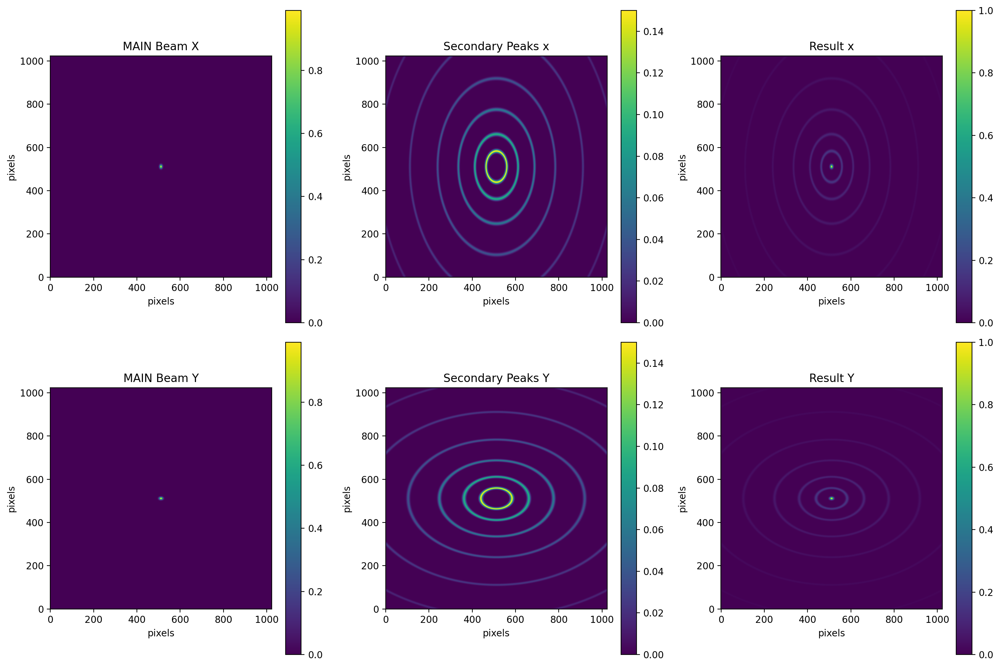

In [10]:
# COORDINATES LIKE THE ONES OF THE MAPS

N = int(N)
ones = np.ones(N)
inds = (np.arange(N)+.5 - N/2.) * pix_size
X = np.outer(ones,inds)
Y = np.transpose(X)
R = np.sqrt(X**2. + Y**2.)


#####################################################################################

# VARIABLES

FWHM_x = 5  # degrees
FWHM_y = 7  # degrees
ellipticity = (FWHM_x - FWHM_y) / (FWHM_x + FWHM_y)
print("ellipticity = ", ellipticity)

array_dB = np.array([-20, -22, -24, -26, -28, -30])  #max values of the secondary peaks
r1 = np.array([0.3, 0.625, 1.1, 1.7, 2.5, 3.4]) #angular distance of the peaks
r = 4 # width of the rings

theta = 0 # angle of rotation of the beam
a = 1 # major axis of ellipses 


#########################################################################################

# BEAM

beam_gauss_x, beam_gauss_y, sec_rings_x,sec_rings_y, beam_x, beam_y = create_beam_secpeaks(FWHM_x, FWHM_y, theta, array_dB, r, r1, X, Y, a, ellipticity)

########################################################################################

# PLOT

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# X
# Main Beam
axes[0][0].imshow(beam_gauss_x, cmap='viridis', origin='lower')
axes[0][0].set_title('MAIN Beam X')
axes[0][0].set_xlabel('pixels')
axes[0][0].set_ylabel('pixels')


# Sec peaks
axes[0][1].imshow(sec_rings_x, cmap='viridis', origin='lower')
axes[0][1].set_title('Secondary Peaks x')
axes[0][1].set_xlabel('pixels')
axes[0][1].set_ylabel('pixels')


# Result
im = axes[0][2].imshow(beam_x, cmap='viridis', origin='lower')
axes[0][2].set_title('Result x')
axes[0][2].set_xlabel('pixels')
axes[0][2].set_ylabel('pixels')


# Y
# Main Beam
axes[1][0].imshow(beam_gauss_y, cmap='viridis', origin='lower')
axes[1][0].set_title('MAIN Beam Y')
axes[1][0].set_xlabel('pixels')
axes[1][0].set_ylabel('pixels')


# Sec peaks
axes[1][1].imshow(sec_rings_y, cmap='viridis', origin='lower')
axes[1][1].set_title('Secondary Peaks Y')
axes[1][1].set_xlabel('pixels')
axes[1][1].set_ylabel('pixels')


# Result
im = axes[1][2].imshow(beam_y, cmap='viridis', origin='lower')
axes[1][2].set_title('Result Y')
axes[1][2].set_xlabel('pixels')
axes[1][2].set_ylabel('pixels')


# Color Bars
for row in axes:
    for ax in row:
        im = ax.get_images()[0]
        cbar = plt.colorbar(im, ax=ax)

plt.tight_layout()
#plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.show()

In [11]:
plot_x = interactive(plot_3d_gaussian, x=fixed(X), y=fixed(Y), result=fixed(beam_x), azimuth=(0, 360, 1),
         elevation=(0, 90, 1), title ="Beam X")
plot_y = interactive(plot_3d_gaussian, x=fixed(X), y=fixed(Y), result=fixed(beam_y), azimuth=(0, 360, 1),
         elevation=(0, 90, 1), title ="Beam Y")

display(plot_x)
display(plot_y)

interactive(children=(IntSlider(value=180, description='azimuth', max=360), IntSlider(value=45, description='e…

interactive(children=(IntSlider(value=180, description='azimuth', max=360), IntSlider(value=45, description='e…

## Beam systematics
I will use beam_x for the convolution, so I add beam systematics to beam_x only

In [12]:
### beam systematics dictionary
bs = {"budy":{"A":1e-3,"FWHP":1.5,"R":14.,"psi":0.3,"polfracQ":0.5,"polfracU":0.01},  
                                                                         # little budy amplitude, 
                                                                         #FWHP, offset spacing, rotationa angle (radians)
                                                                        # pol_fraction for Q and U
     "ghostshelf": {"A":1e-4,"Diam":20.,"roll_off":7.},    #model of ghosting, amplitude (A), diameter (Diam) 
     "hex_crostalk":{"grid_space": 2.5,"N":5,"neighbor_exp_fall":0.01}, 
                                                                               ## model of optical cross talk 
                                                                               ## to detectors on a hex grid
                                                                               ## assumed to be exponetial
                                                                               ## assumed to be 50% polairzed
      "TtoQ":{"mono":1e-3,"dip_x":1e-2,"dip_y":1e-2,"quad_x":1e-2,"quad_45":1e-2},
      "TtoU":{"mono":1e-3,"dip_x":1e-2,"dip_y":1e-2,"quad_x":1e-2,"quad_45":1e-2},
                                                                  ## multiplole expansion leakage
      'psi':0.01*np.pi/180.
                                  ## detetor angle rotations
                    
                   }

In [13]:
# FROM THE FUNCTIONS make_little_buddies, make_ghosting_beam and make_cross_talk_beam_grid WE ADD SYSTEMATICS TO THE BEAM
def make_systematics_beams(N,pix_size,beam_size_fwhp, beam,bs):
    
    # intitalize the beam to zero
    B_TT=B_QQ=B_UU=B_QT=B_UT=B_QU=B_UQ=0.
    
    ## merge this into the beam
    B_TT += beam
    B_QQ += beam
    B_UU += beam
    
    beam_peak = np.max(beam)
    
    # make the little buddies
    Budy_TT,Budy_QT,Budy_UT = make_little_buddies(N,pix_size,beam_size_fwhp,bs,beam_peak)
    ## merge this into the beam
    B_TT += Budy_TT
    B_QT += Budy_QT
    B_UT += Budy_UT

    # make the ghosting shelf
    shelf = make_ghosting_beam(N,pix_size,beam_size_fwhp,bs,beam_peak)
    ## merge this into the beam
    B_TT += shelf
    B_QQ += shelf
    B_UU += shelf
    
    # make the cross talk beam
    # make a hex grid centered on the beam
    hex_grid = make_cross_talk_beam_grid(N,pix_size,beam_size_fwhp,bs)
    #convolve the hex grid with the beam
    cross_talk = convlolve(hex_grid,beam)
    ## merge this into the beam
    B_TT += cross_talk
    B_QQ += cross_talk
    B_UU += cross_talk
    B_QT += cross_talk
    B_UT += cross_talk
    
    
    ## add the monopole + dipole + quadrupole T->P leakages
    # make the beam modes
    mono,dip_x,dip_y,quad_x,quad_45 = make_monopole_dipole_quadrupole(N,pix_size,beam_size_fwhp,bs)
    TtoQ = bs["TtoQ"]["mono"] * mono
    TtoQ += bs["TtoQ"]["dip_x"] * dip_x
    TtoQ += bs["TtoQ"]["dip_y"] * dip_y
    TtoQ += bs["TtoQ"]["quad_x"] * quad_x
    TtoQ += bs["TtoQ"]["quad_45"] * quad_45
    TtoU = bs["TtoU"]["mono"] * mono
    TtoU += bs["TtoU"]["dip_x"] * dip_x
    TtoU += bs["TtoU"]["dip_y"] * dip_y
    TtoU += bs["TtoU"]["quad_x"] * quad_x
    TtoU += bs["TtoU"]["quad_45"] * quad_45
    ## add to the beams
    B_QT += TtoQ
    B_UT += TtoU
    
    
    return(B_TT,B_QQ,B_UU,B_QT,B_UT,B_QU,B_UQ)  

beam max: 4.342923104481638e-05 beam min: 11.65580898892415


<Figure size 640x480 with 0 Axes>

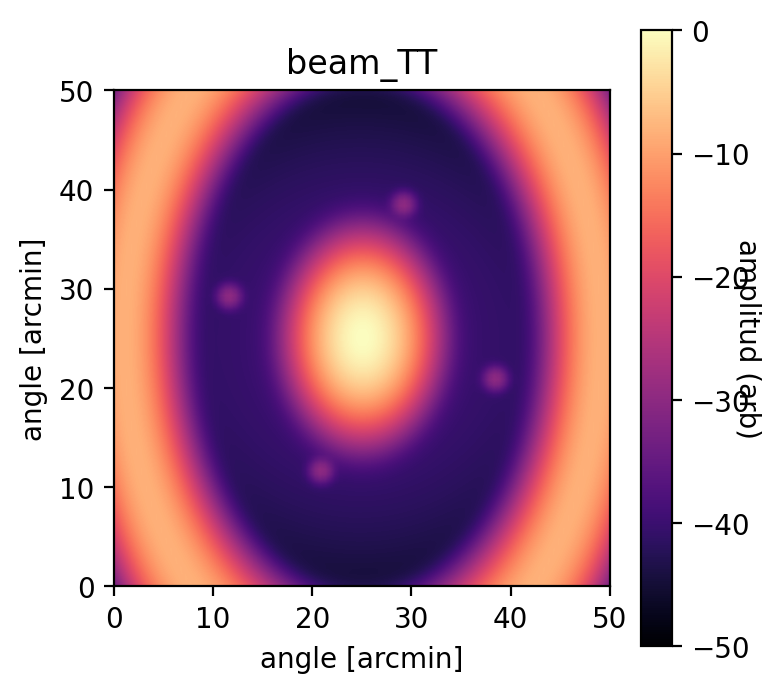

beam max: 4.342923104481638e-05 beam min: 11.65539295021538


<Figure size 640x480 with 0 Axes>

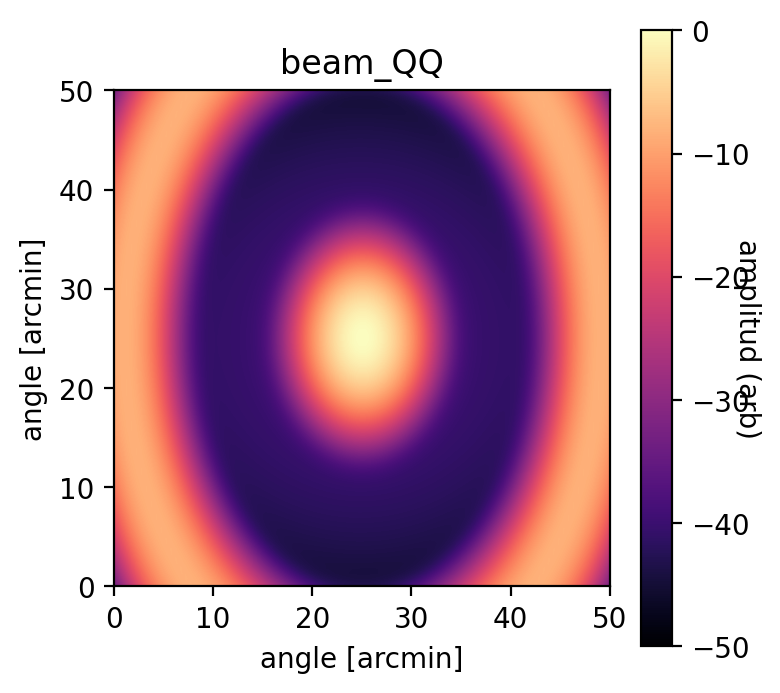

beam max: 4.342923104481638e-05 beam min: 11.65539295021538


<Figure size 640x480 with 0 Axes>

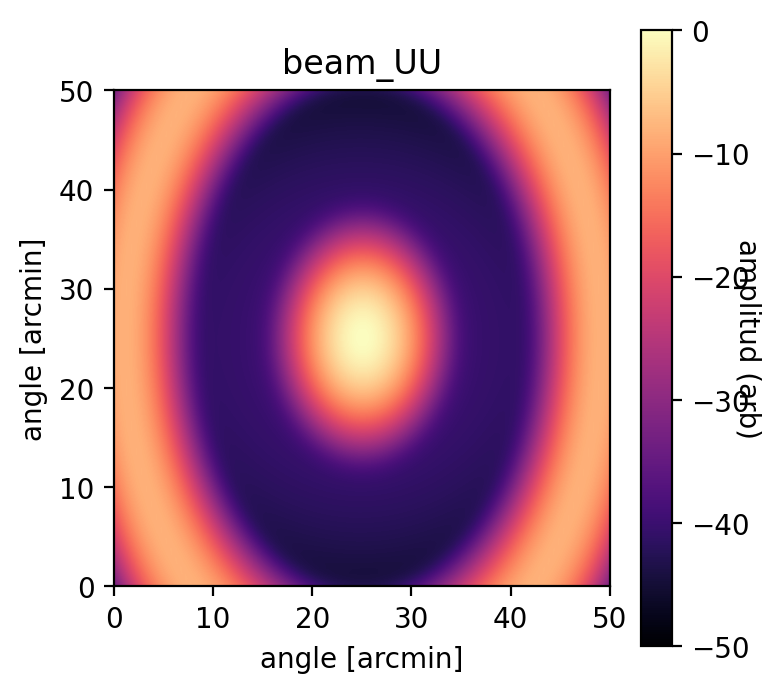

beam max: 4.342923104481638e-05 beam min: 13.041606984433503


<Figure size 640x480 with 0 Axes>

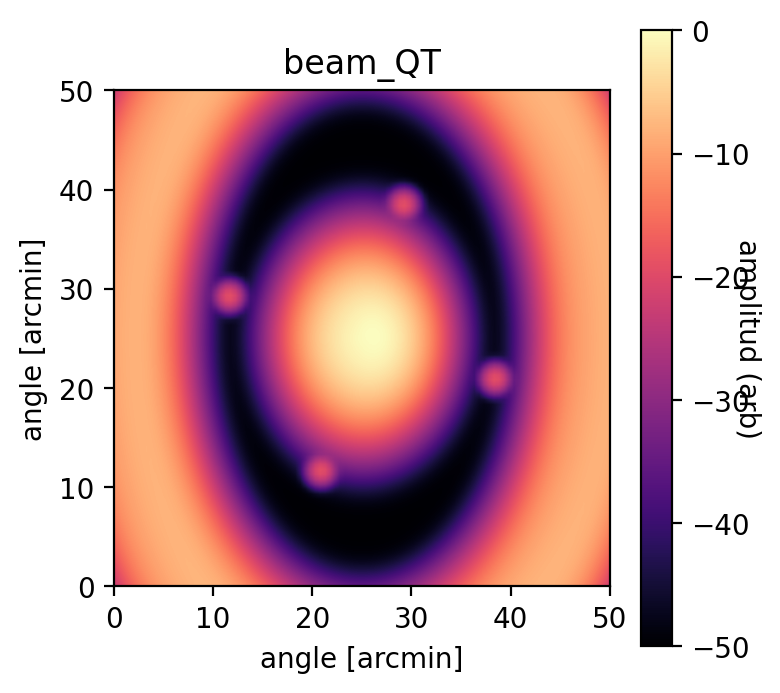

beam max: 4.342923104481638e-05 beam min: 13.040334548333277


<Figure size 640x480 with 0 Axes>

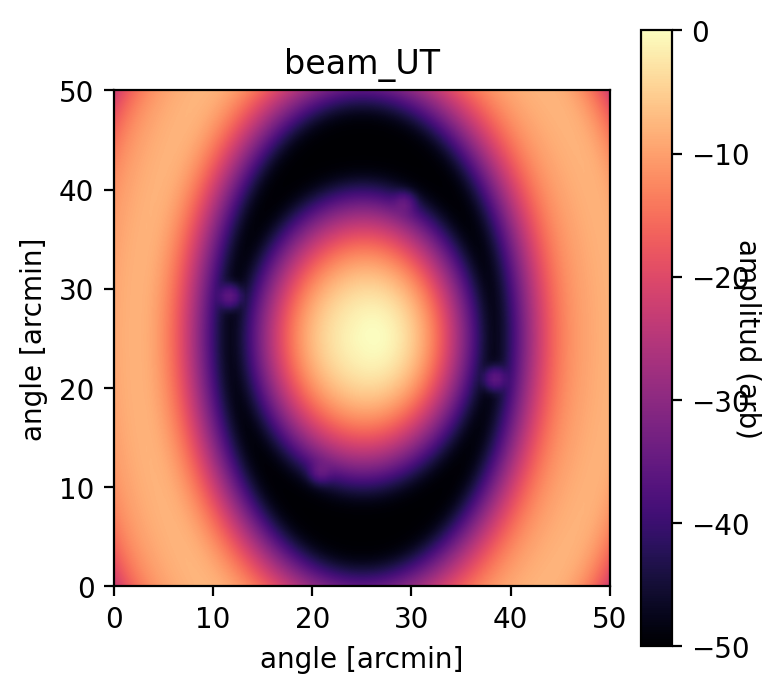

0

In [40]:
# APPLY BEAM SYSTEMATICS TO THE BEAM (beam_x)

beam_TT,beam_QQ,beam_UU,beam_QT,beam_UT,beam_QU,beam_UQ = make_systematics_beams(N,pix_size,FWHM_x, beam_x,bs)

beam_to_plot = beam_TT
beam_to_plot = beam_to_plot / np.max(beam_to_plot) + 1e-5
beam_to_plot = 10. * np.log10(beam_to_plot)
Plot_beam(beam_to_plot,np.min(beam_to_plot),np.max(beam_to_plot),N,pix_size,50, "beam_TT")

beam_to_plot = beam_QQ
beam_to_plot = beam_to_plot / np.max(beam_to_plot) + 1e-5
beam_to_plot = 10. * np.log10(beam_to_plot)
Plot_beam(beam_to_plot,np.min(beam_to_plot),np.max(beam_to_plot),N,pix_size,50, "beam_QQ")
                                                            
beam_to_plot = beam_UU
beam_to_plot = beam_to_plot / np.max(beam_to_plot) + 1e-5
beam_to_plot = 10. * np.log10(beam_to_plot)
Plot_beam(beam_to_plot,np.min(beam_to_plot),np.max(beam_to_plot),N,pix_size,50,"beam_UU")


beam_to_plot = beam_QT
if np.any(beam_to_plot <= 0):
    beam_to_plot[beam_to_plot <= 0] = 1e-21
beam_to_plot = beam_to_plot / np.max(beam_to_plot) + 1e-5
beam_to_plot = 10. * np.log10(beam_to_plot)
Plot_beam(beam_to_plot,np.min(beam_to_plot),np.max(beam_to_plot),N,pix_size,50,"beam_QT")

beam_to_plot = beam_UT
beam_to_plot = beam_to_plot / np.max(beam_to_plot) + 1e-5
if np.any(beam_to_plot <= 0):
    beam_to_plot[beam_to_plot <= 0] = 1e-21
beam_to_plot = 10. * np.log10(beam_to_plot)
Plot_beam(beam_to_plot,np.min(beam_to_plot),np.max(beam_to_plot),N,pix_size,50,"beam_UT")

## Convolve the beam with the maps

In [41]:
def convolve_map_with_beam(Map, beam):

    FT_beam = np.fft.fft2(np.fft.fftshift(beam))
    FT_Map  = np.fft.fft2(np.fft.fftshift(Map))
    
    convolved_map = np.fft.fftshift(np.real(np.fft.ifft2(FT_beam*FT_Map)))

    return(convolved_map)

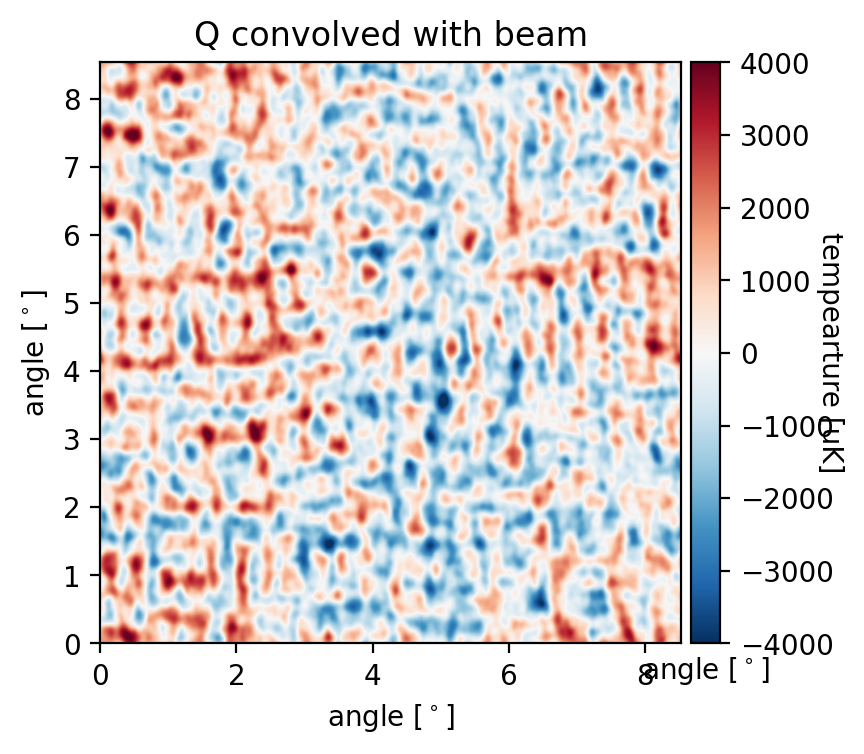

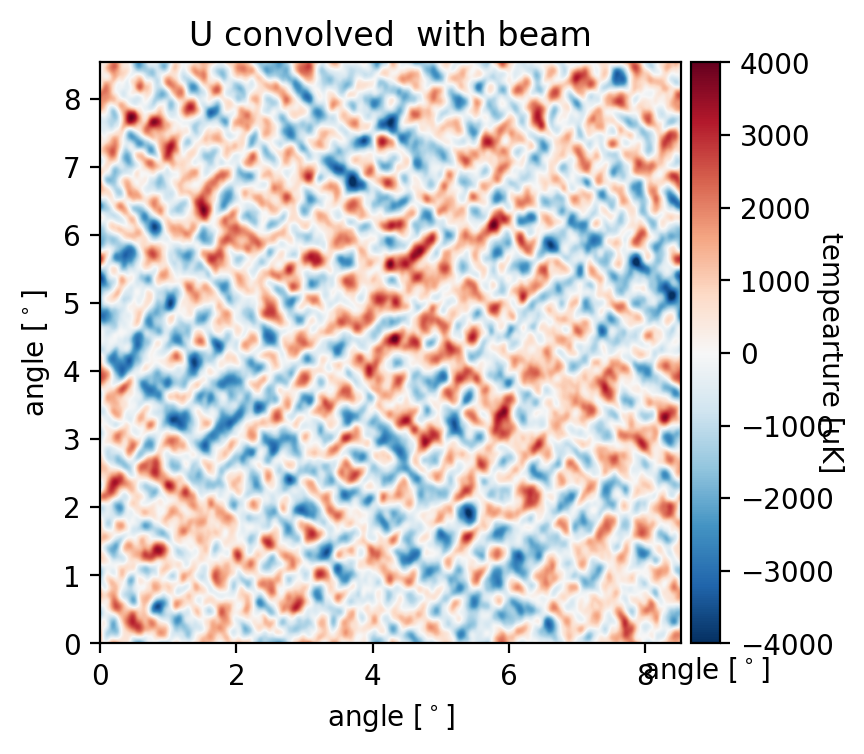

In [43]:
## MAPS IN THE REAL SPACE
Q_map_convolved = convolve_map_with_beam(Q_map, beam_QQ)
U_map_convolved = convolve_map_with_beam(U_map, beam_UU)

plt.title("Q convolved with beam")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_convolved,c_min*20,c_max*20,X_width,Y_width)

plt.title("U convolved  with beam")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_convolved,c_min*20,c_max*20,X_width,Y_width)

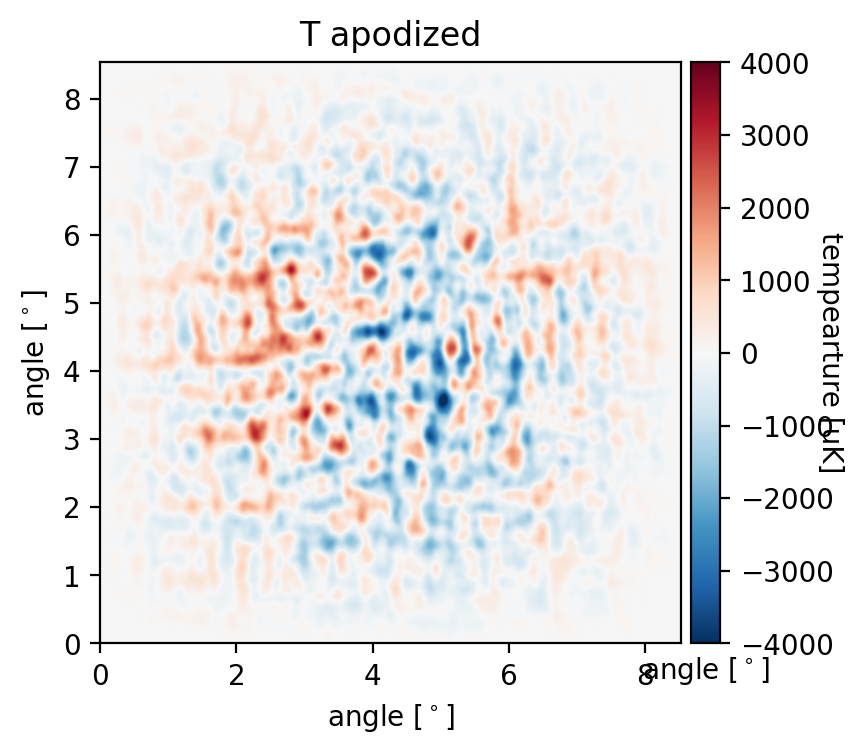

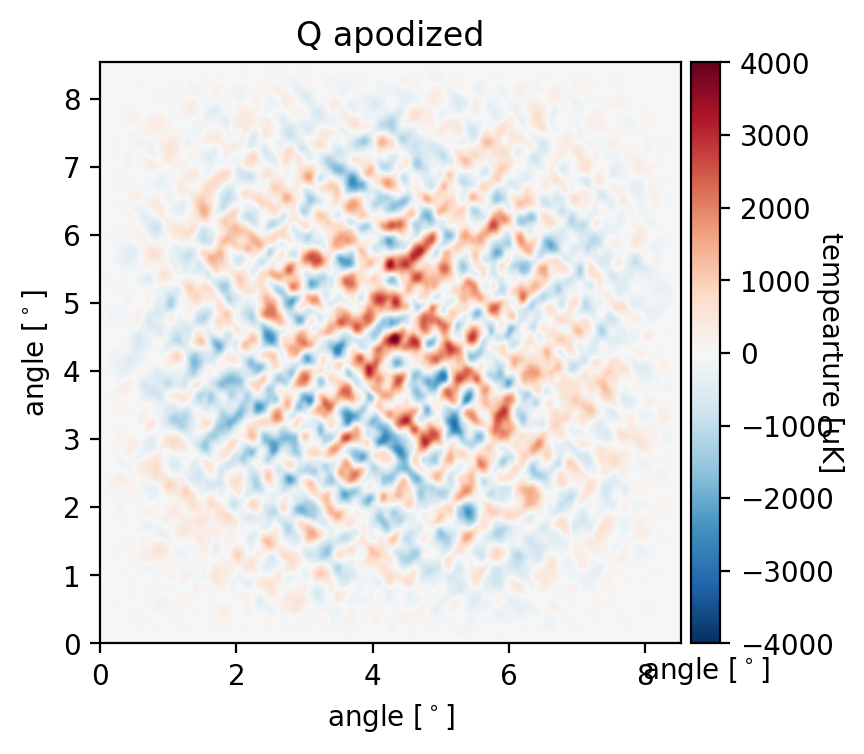

In [44]:
# APODIZATION
window = (cosine_window(N))

Q_map_convolved = window * Q_map_convolved
U_map_convolved = window * U_map_convolved


plt.title("T apodized")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_convolved,c_min*20,c_max*20,X_width,Y_width)

plt.title("Q apodized")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_convolved,c_min*20,c_max*20,X_width,Y_width)

# ANALYSIS

- Deconvolution of Q_map_convolved and Q_map_convolved from beam_QQ and beam_UU
- From Q_decon and U_deconv to E_deconv and B_deconv
- Recover PS and compare them to the original ones

### Deconvolution

In [45]:
def correct_lr(map, init_beam,N, pix_size, mode='onestep',pad = None, filter_eps=1e-10, eps=1e-12, post_f=None, iter=50):
    from copy import deepcopy
    # GET MAP PARAMETERS 
    N = int(N)
    ones = np.ones(N)
    inds = (np.arange(N)+.5 - N/2.) * pix_size
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    r = np.sqrt(X**2. + Y**2.)
    
    
    
    #shape = [4*(aMap.MAP.shape[0]+1)-1, 4*(aMap.MAP.shape[1]+1)-1]
    #init_bmap, r = init_beam.return_bMap(pixscale=pixscale,shape=[811,811],rad=True, oversamp=1)
    init_bmap = map
    
    init_bmap = 10**(init_bmap/10) * merge_cosine(r, center = 345, width=40)
    init_bmap /= np.nanmax(init_bmap)
  
    init_bmap = init_bmap / np.nanmax(init_bmap)

    init_bmap[init_bmap<0] = 0.
    
    # DECONVOLVE
    if mode=='onestep':
        psf_ = init_bmap / np.nansum(init_bmap)
        dat_ = deepcopy(map)
        if pad!=None:
            pad_pix = int(pad*np.max(np.shape(dat_)))
            new = np.ones([np.shape(dat_)[0]+(2*pad_pix), np.shape(dat_)[1]+(2*pad_pix)])*np.nanmedian(dat_)
            new[pad_pix:-pad_pix, pad_pix:-pad_pix] = dat_
            dat_ = new
        map_ = deepcopy(dat_)
        if iter==None:
            SNAPSHOTS = np.array([0,10,20,30,40,50])
        else:
            SNAPSHOTS = np.array([0,int(iter)])
        
        allframes = np.zeros([np.nanmax(SNAPSHOTS)+1,np.shape(dat_)[0],np.shape(dat_)[1]])
        frames = np.zeros([len(SNAPSHOTS),np.shape(dat_)[0],np.shape(dat_)[1]])
        frames[0] = map_
        allframes[0] = map_
        
        n_iter = 0
        i = 1
        
    return map_



def merge_cosine(X,center=30,width=5):
    mask = np.ones(X.shape)
    mask[X>center] = 0.
    funcmsk = np.all([X>center-width/2,X<center+width/2],axis=0)
    mask[funcmsk] = (1-np.sin((X[funcmsk]-center)*np.pi/width))/2
    return mask**2

In [46]:
# da MAPEXT ( https://github.com/tjrennie/MAPEXT)
# VECCHIA
'''
def richardson_lucy(image, psf, im_deconv=None, num_iter=1, clip=False, 
                     filter_epsilon=False, eps=1e-12, progress=False):
    
    if im_deconv is None:
        im_deconv = np.full(image.shape, 0.5, dtype=float)
    
    psf_mirror = np.flip(psf)
    
    if progress:
        iter_range = tqdm(range(num_iter)) if not progress == 'notebook' else tqdm_notebook(range(num_iter))
    else:
        iter_range = range(num_iter)
        
    for i in iter_range:
        conv = convolve(im_deconv, psf, mode='same') + eps
        if filter_epsilon:
            relative_blur = np.where(conv < filter_epsilon, 0, image / conv)
        else:
            relative_blur = image / conv
        
        im_deconv *= convolve(relative_blur, psf_mirror, mode='same')
        
        
    return im_deconv
'''

"\ndef richardson_lucy(image, psf, im_deconv=None, num_iter=1, clip=False, \n                     filter_epsilon=False, eps=1e-12, progress=False):\n    \n    if im_deconv is None:\n        im_deconv = np.full(image.shape, 0.5, dtype=float)\n    \n    psf_mirror = np.flip(psf)\n    \n    if progress:\n        iter_range = tqdm(range(num_iter)) if not progress == 'notebook' else tqdm_notebook(range(num_iter))\n    else:\n        iter_range = range(num_iter)\n        \n    for i in iter_range:\n        conv = convolve(im_deconv, psf, mode='same') + eps\n        if filter_epsilon:\n            relative_blur = np.where(conv < filter_epsilon, 0, image / conv)\n        else:\n            relative_blur = image / conv\n        \n        im_deconv *= convolve(relative_blur, psf_mirror, mode='same')\n        \n        \n    return im_deconv\n"

In [47]:
# richardson_lucy ci mette più tempo rispetto a correct_lr
#Q_deconv = richardson_lucy(Q_map_convolved, beam_QQ, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)
#U_deconv = richardson_lucy(U_map_convolved, beam_UU, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)

#CORRECT RICHARSON LUCY
Q_deconv = correct_lr(Q_map_convolved, beam_QQ,N, pix_size, 'onestep',None, 1e-10, 1e-12, None, 50)
U_deconv = correct_lr(U_map_convolved, beam_UU,N, pix_size, 'onestep',None, 1e-10, 1e-12, None, 50)

C:\Users\guide\AppData\Local\Temp\ipykernel_13116\1513843110.py:17: RuntimeWarning: overflow encountered in power
  init_bmap = 10**(init_bmap/10) * merge_cosine(r, center = 345, width=40)
C:\Users\guide\AppData\Local\Temp\ipykernel_13116\1513843110.py:18: RuntimeWarning: invalid value encountered in divide
  init_bmap /= np.nanmax(init_bmap)
C:\Users\guide\AppData\Local\Temp\ipykernel_13116\1513843110.py:20: RuntimeWarning: invalid value encountered in divide
  init_bmap = init_bmap / np.nanmax(init_bmap)


Q_map, U_map = original map, not convolved
Q_map_convolved = after convolution and apodization
Q_deconv = after deconvolution

Now I compare the original Q, U maps with the Q, U maps obtained after the convolution and deconvolution to see the differences. Remember: after the convolution there's the apodization, so the original maps will be not apodized.
So in the map_list I'll add the apodization to the original maps so that theu're a bit easier to compare. 


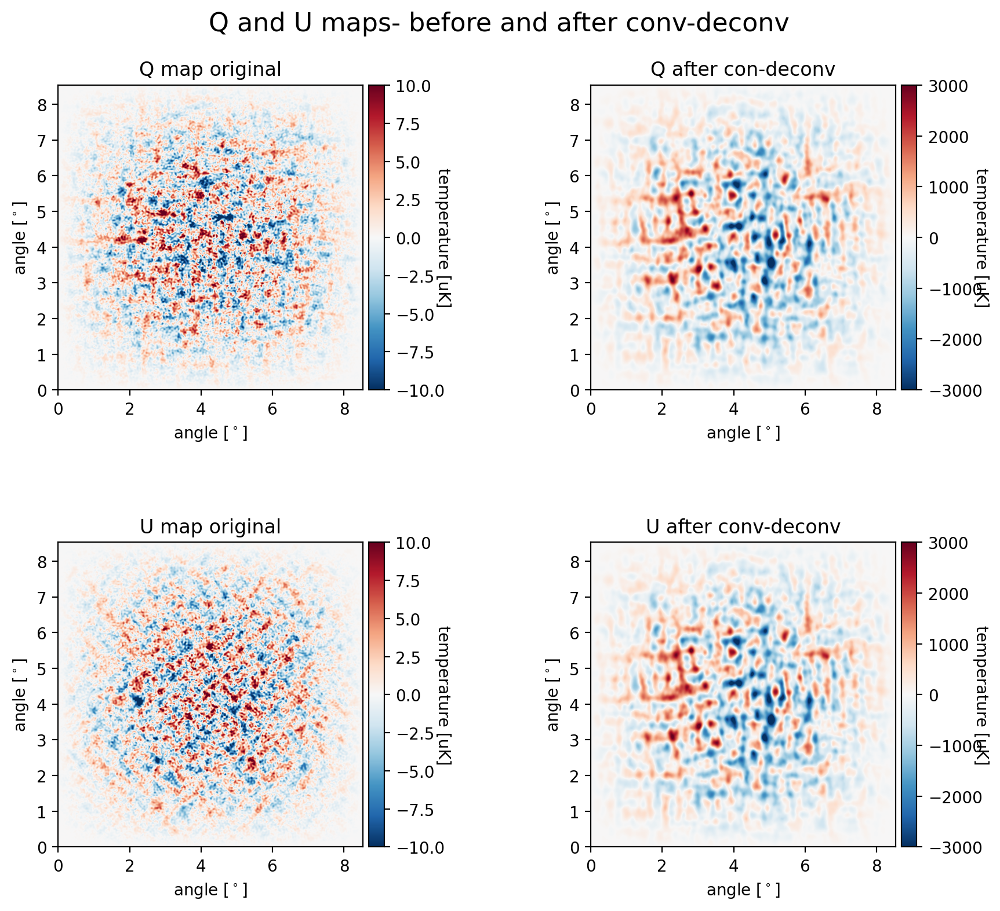

In [49]:
# COMPARISON PLOT
map_list      = [window * Q_map, Q_deconv,window * U_map, Q_deconv] 
title_list    = ["Q map original", "Q after con-deconv", "U map original", "U after conv-deconv"]
color_rescale = [0.05, 15, 0.05, 15]

fig, axs = plt.subplots(2, 2, figsize=(10, 8))
axs      = axs.flatten()


for i, map_data in enumerate(map_list):

        Plot_CMB_Map_compact(axs[i], map_data, c_min*color_rescale[i], c_max*color_rescale[i], X_width, Y_width)
        axs[i].set_title(title_list[i])
        
        
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0.5, top=0.90)
plt.suptitle('Q and U maps- before and after conv-deconv', fontsize=16)
plt.show()

### From QU to EB

In [22]:
E_deconv, B_deconv = QU2EB(N,pix_size,Q_deconv * window,U_deconv * window)

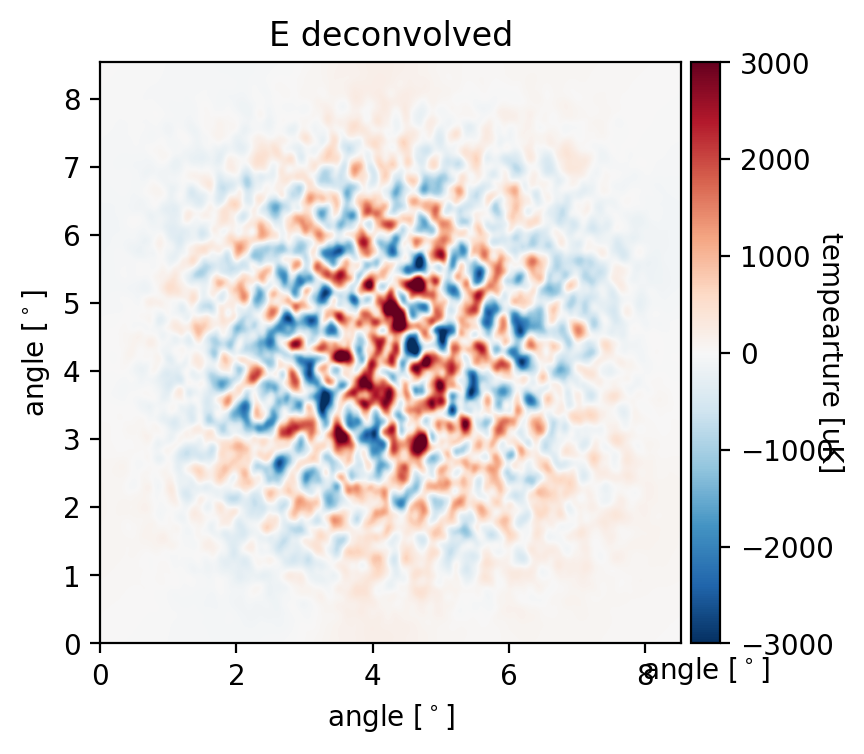

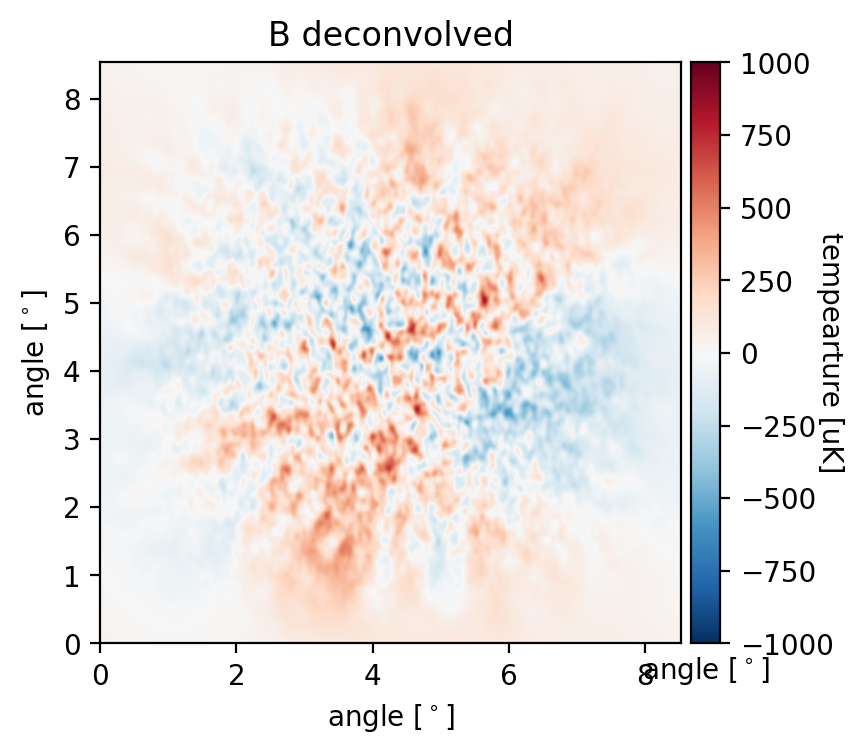

In [23]:
plt.title("E deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_deconv,c_min*15,c_max*15,X_width,Y_width)

plt.title("B deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_deconv,c_min*5,c_max*5,X_width,Y_width)

### PS

In [24]:
delta_l = 50.
l_max   = 2500

binned_l_E_deconv, binned_spectrum_E_deconv = calculate_2d_spectrum(E_deconv,E_deconv,delta_l,l_max,pix_size,N)
binned_l_B_deconv, binned_spectrum_B_deconv = calculate_2d_spectrum(B_deconv,B_deconv,delta_l,l_max,pix_size,N)

In [25]:
# ci mette un po' (un paio di minuti)

beam_size_fwhp    = 1.25
white_noise_level = 0.5
atmospheric_noise_level = 0.1 * 0 #azzerato
one_over_f_noise_level  = 0.2 * 0 #azzerato

# TRANSFER FUNCTION - multiplicative bias
N_iterations  = 16
signal_only_E_deconv = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B_deconv = np.zeros([N_iterations,int(l_max/delta_l)])

i = 0

while (i < N_iterations):
         
    map_convolved_E_deconv = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_deconv)
    map_convolved_B_deconv = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_deconv)
    
    binned_l_cur_E_deconv, binned_spectrum_cur_E_deconv = calculate_2d_spectrum(map_convolved_E_deconv*window, map_convolved_E_deconv*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B_deconv, binned_spectrum_cur_B_deconv = calculate_2d_spectrum(map_convolved_B_deconv*window, map_convolved_B_deconv*window,delta_l,l_max,pix_size,N)
    
    
    signal_only_E_deconv[i,:] = binned_spectrum_cur_E_deconv
    sys.stdout.flush()
    signal_only_B_deconv[i,:] = binned_spectrum_cur_B_deconv
    sys.stdout.flush()
    i = i + 1
    
sig_only_mean_spectrum_E_deconv, rms_E_deconv = average_N_spectra(signal_only_E_deconv,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B_deconv, rms_B_deconv = average_N_spectra(signal_only_B_deconv,N_iterations,int(l_max/delta_l))

sub_sampled_CLs_E_deconv = Original_PS[2][binned_l_E_deconv] * 2. * np.pi / (binned_l_E_deconv * (binned_l_E_deconv+1.))
sub_sampled_CLs_B_deconv = Original_PS[3][binned_l_B_deconv] * 2. * np.pi / (binned_l_B_deconv * (binned_l_B_deconv+1.))

Multiplicative_Bias_est_E_deconv =  sub_sampled_CLs_E_deconv / sig_only_mean_spectrum_E_deconv
Multiplicative_Bias_est_B_deconv =  sub_sampled_CLs_B_deconv / sig_only_mean_spectrum_B_deconv



# NOISE - noise bias
noise_only = np.zeros([N_iterations,int(l_max/delta_l)])
i = 0

while (i <N_iterations):
    Noise = make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level)
    binned_l_cur, binned_spectrum_cur = calculate_2d_spectrum(Noise*window,Noise*window,delta_l,l_max,pix_size,N)
    
    noise_only[i,:] = binned_spectrum_cur
    sys.stdout.flush()
    i = i + 1

noise_only_mean_spectrum, rms_not_needed = average_N_spectra(noise_only,N_iterations,int(l_max/delta_l))
Additive_Bias_est = noise_only_mean_spectrum

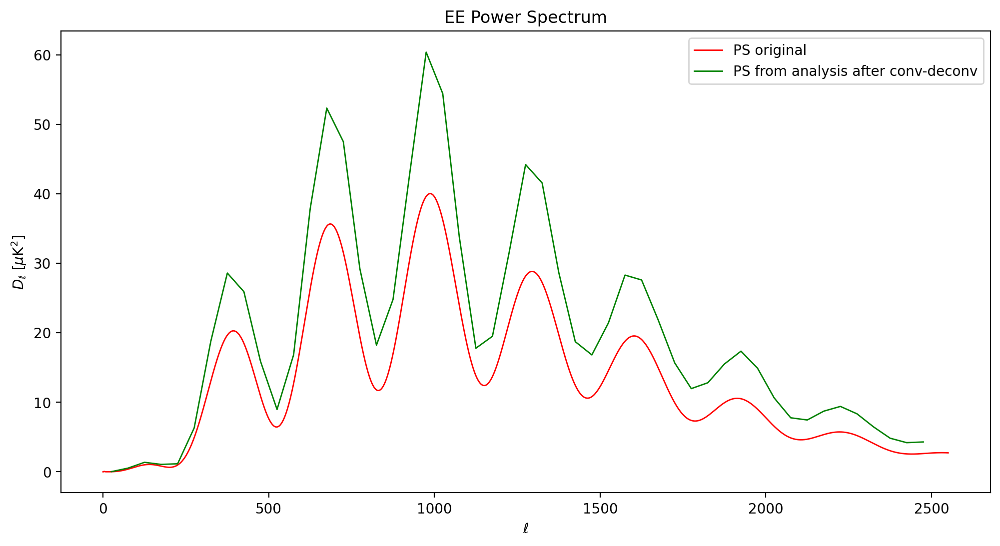

In [26]:
plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[2], label="PS original", c="r", linewidth=1)

plt.plot(binned_l_E_deconv,(binned_spectrum_E_deconv - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_deconv*\
             binned_l_E_deconv * (binned_l_E_deconv+1.)/2. / np.pi,color='green', label="PS from analysis after conv-deconv", linewidth=1)



plt.title("EE Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

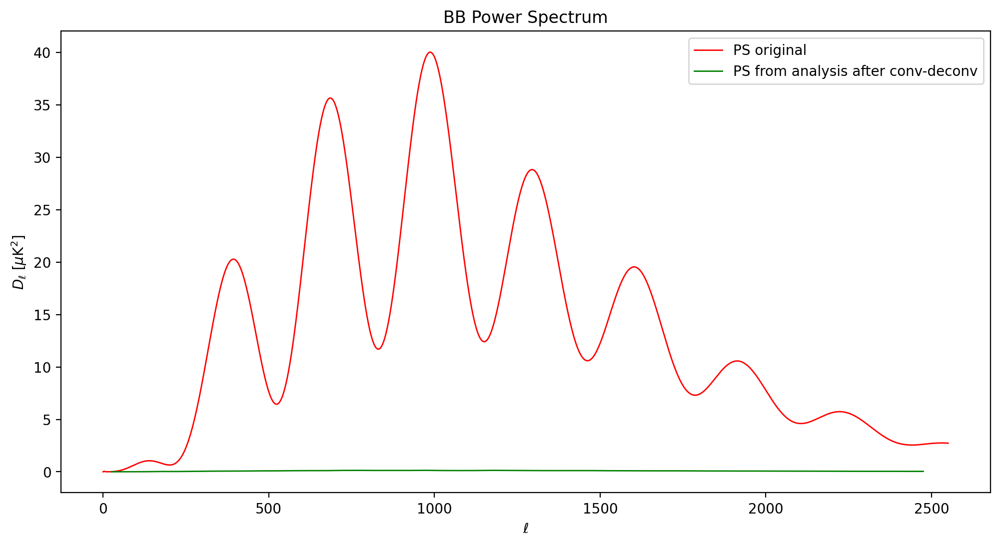

In [27]:
plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[2], label="PS original", c="r", linewidth=1)

plt.plot(binned_l_B_deconv,(binned_spectrum_B_deconv - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_deconv*\
             binned_l_B_deconv * (binned_l_B_deconv+1.)/2. / np.pi,color='green', label="PS from analysis after conv-deconv", linewidth=1)



plt.title("BB Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()